In [ ]:
# --- 1. MOUNT DRIVE & INSTALL LIBRARY ---
import os
import shutil
from google.colab import drive

# Mount Drive
if not os.path.exists('/content/drive'):
    drive.mount('/content/drive')

# Install Library (Hanya perlu sekali di awal sesi)
print("⏳ Sedang menginstall library... (Tunggu 2-3 menit)")
!pip install -q git+https://github.com/huggingface/diffusers.git
!pip install -q -U -r https://raw.githubusercontent.com/huggingface/diffusers/main/examples/text_to_image/requirements.txt
!pip install -q bitsandbytes peft accelerate transformers

# Download script training
!wget -q -nc https://raw.githubusercontent.com/huggingface/diffusers/main/examples/text_to_image/train_text_to_image_lora.py

print("✅ Setup Selesai! Sekarang kamu bisa memanggil fungsi training.")

Mounted at /content/drive
⏳ Sedang menginstall library... (Tunggu 2-3 menit)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.0/8.0 MB 55.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 899.7/899.7 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 594.3/594.3 MB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 59.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.0/88.0 MB 13.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 954.8/954.8 kB 67.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.1/193.1 MB 13.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 78.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.6/63.6 MB 37.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 267.5/267.5 MB 2.9 MB/s eta 0:0

In [ ]:
import os
import json
import math
from IPython import get_ipython

def fix_metadata_and_train_archive2_save_best(epochs=150, batch_size=6):
    # --- KONFIGURASI ---
    FOLDER_UTAMA = "archive"
    DATASET_DIR = f"/content/drive/MyDrive/DL_Finalisasi/dataset/{FOLDER_UTAMA}"
    OUTPUT_DIR = f"/content/drive/MyDrive/COLAB/ModelLora_Batik_HighBatch"
    MODEL_BASE = "runwayml/stable-diffusion-v1-5"

    print(f"\n{'='*50}")
    print(f"🚑 PERBAIKAN METADATA & TRAINING (SAVE EVERY EPOCH)")
    print(f"{'='*50}\n")

    if not os.path.exists(DATASET_DIR):
        print(f"❌ Error: Folder {DATASET_DIR} tidak ditemukan!")
        return

    # --- 1. HAPUS METADATA LAMA ---\n
    metadata_path = os.path.join(DATASET_DIR, "metadata.jsonl")
    if os.path.exists(metadata_path):
        os.remove(metadata_path)
        print("🗑️ Metadata lama dihapus.")

    # --- 2. BUAT METADATA BARU ---
    print("📝 Sedang menulis ulang metadata.jsonl...")
    metadata = []
    valid_extensions = ('.png', '.jpg', '.jpeg', '.webp')
    count = 0

    for root, dirs, files in os.walk(DATASET_DIR):
        if ".ipynb_checkpoints" in root: continue
        folder_name = os.path.basename(root)
        if folder_name == FOLDER_UTAMA: continue

        # Format caption: batik_style_namabatik
        style_name = folder_name.replace("batik-", "").replace("batik_", "").replace("-", "_")
        caption = f"batik_style_{style_name}"

        for filename in files:
            if filename.lower().endswith(valid_extensions):
                full_path = os.path.join(root, filename)
                rel_path = os.path.relpath(full_path, DATASET_DIR)
                metadata.append({"file_name": rel_path, "text": caption})
                count += 1

    if count == 0:
        print("❌ Tidak ada gambar ditemukan!")
        return

    with open(metadata_path, 'w') as f:
        for entry in metadata:
            json.dump(entry, f)
            f.write('\n')

    print(f"✅ Metadata BARU siap! Total: {count} gambar.")

    # --- 3. HITUNG STEPS UNTUK 'SAVE BEST' STRATEGY ---
    # Kita ingin save SETIAP EPOCH agar tidak kehilangan momen terbaik
    # Rumus: Jumlah Gambar / Batch Size = 1 Epoch
    steps_per_epoch = math.ceil(count / batch_size)

    print(f"📊 Info Training:")
    print(f"   - Total Gambar: {count}")
    print(f"   - Batch Size: {batch_size}")
    print(f"   - Steps per Epoch: {steps_per_epoch} steps")
    print(f"   - Total Epoch: {epochs}")
    print(f"   👉 Model akan disimpan setiap {steps_per_epoch} steps (Tiap Epoch)")

    print(f"\n🚀 MEMULAI TRAINING...")

    # Prompt validasi untuk mengecek kualitas setiap epoch
    # Ganti 'batik_style_parang' dengan salah satu style kamu jika mau spesifik
    val_prompt = "batik_style_parang"

    command = (
        f"accelerate launch train_text_to_image_lora.py "
        f"--pretrained_model_name_or_path='{MODEL_BASE}' "
        f"--train_data_dir='{DATASET_DIR}' "
        f"--caption_column='text' "
        f"--resolution=512 "
        f"--random_flip "
        f"--train_batch_size={batch_size} "
        f"--gradient_accumulation_steps=1 "
        f"--num_train_epochs={epochs} "
        # KUNCI SAVE BEST: Simpan setiap kali 1 epoch selesai
        f"--checkpointing_steps={steps_per_epoch} "
        # VALIDASI: Generate gambar setiap epoch supaya bisa dipantau
        f"--validation_prompt='{val_prompt}' "
        f"--validation_epochs=1 "
        f"--learning_rate=1e-04 "
        f"--lr_scheduler='cosine' "
        f"--lr_warmup_steps=0 "
        f"--seed=42 "
        f"--output_dir='{OUTPUT_DIR}' "
        f"--mixed_precision='fp16' "
        f"--rank=128 "
        # Opsional: Hapus checkpoint lama otomatis (simpan 5 terbaik terakhir)
        # f"--checkpoints_total_limit=5 "
    )

    get_ipython().system(command)
    print(f"\n🎉 TRAINING SELESAI!")
    print(f"Cek folder: {OUTPUT_DIR}")
    print("Di sana akan ada banyak folder 'checkpoint-XXX'.")
    print("Gunakan checkpoint dengan nomor langkah (steps) dimana hasil validasi terlihat paling bagus.")

# Jalankan dengan konfigurasi baru (150 epoch)
fix_metadata_and_train_archive2_save_best(epochs=80, batch_size=28)


🚑 PERBAIKAN METADATA & TRAINING (SAVE EVERY EPOCH)

🗑️ Metadata lama dihapus.
📝 Sedang menulis ulang metadata.jsonl...
✅ Metadata BARU siap! Total: 560 gambar.
📊 Info Training:
   - Total Gambar: 560
   - Batch Size: 28
   - Steps per Epoch: 20 steps
   - Total Epoch: 80
   👉 Model akan disimpan setiap 20 steps (Tiap Epoch)

🚀 MEMULAI TRAINING...
The following values were not passed to `accelerate launch` and had defaults used instead:
	`--num_processes` was set to a value of `1`
	`--num_machines` was set to a value of `1`
	`--mixed_precision` was set to a value of `'no'`
	`--dynamo_backend` was set to a value of `'no'`
To avoid this warning pass in values for each of the problematic parameters or run `accelerate config`.
2025-12-16 05:08:56.791004: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable 

⏳ Loading Stable Diffusion & LoRA...


Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .
No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/n

⏳ Loading CLIP Model (Juri Penilai)...

🚀 Mulai Generate 10 Gambar...


  0%|          | 0/30 [00:00<?, ?it/s]

✅ [1/10] Parang - Score: 27.64


  0%|          | 0/30 [00:00<?, ?it/s]

✅ [2/10] Megamendung - Score: 28.50


  0%|          | 0/30 [00:00<?, ?it/s]

✅ [3/10] Kawung - Score: 27.27


  0%|          | 0/30 [00:00<?, ?it/s]

✅ [4/10] Sekar_Jagad - Score: 28.27


  0%|          | 0/30 [00:00<?, ?it/s]

✅ [5/10] Tambal - Score: 29.31


  0%|          | 0/30 [00:00<?, ?it/s]

✅ [6/10] Sidomukti - Score: 33.46


  0%|          | 0/30 [00:00<?, ?it/s]

✅ [7/10] Truntum - Score: 30.11


  0%|          | 0/30 [00:00<?, ?it/s]

✅ [8/10] Lasem - Score: 24.81


  0%|          | 0/30 [00:00<?, ?it/s]

✅ [9/10] Tujuh_Rupa - Score: 29.25


  0%|          | 0/30 [00:00<?, ?it/s]

✅ [10/10] Priyangan - Score: 30.33


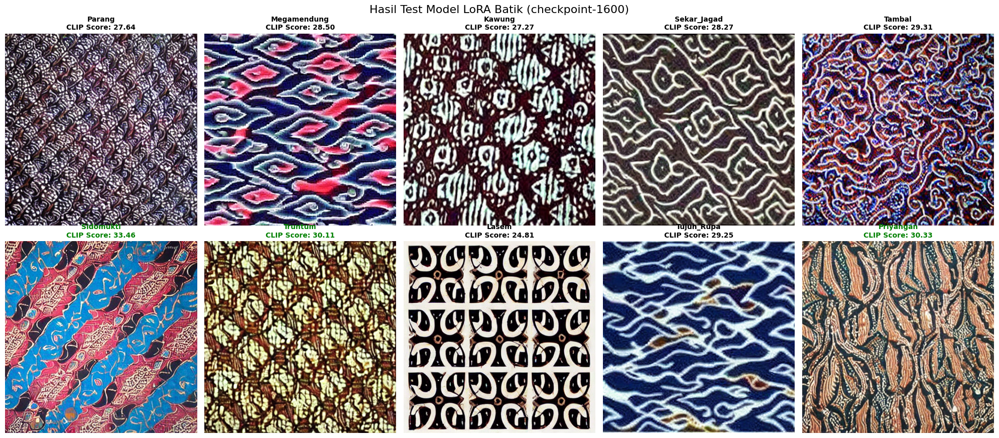

In [ ]:
import torch
from diffusers import StableDiffusionPipeline
from transformers import CLIPProcessor, CLIPModel
import matplotlib.pyplot as plt
import numpy as np
import os
from google.colab import drive

# --- 0. MOUNT DRIVE (WAJIB SETELAH RESTART) ---
if not os.path.exists('/content/drive'):
    drive.mount('/content/drive')

# --- 1. KONFIGURASI ---
# Pastikan folder checkpoint ini BENAR-BENAR ADA di Google Drive kamu.
# Cek di folder file di kiri colab. Kalau training sampai 1600, pakai 1600.
LORA_PATH = "/content/drive/MyDrive/COLAB/ModelLora_Batik_HighBatch/checkpoint-1600"
BASE_MODEL = "runwayml/stable-diffusion-v1-5"

# Masukkan 10 jenis batik (atau prompt) yang mau dites
PROMPTS_LIST = [
    "batik_style_parang", "batik_style_megamendung", "batik_style_kawung", "batik_style_sekar_jagad", "batik_style_tambal",
    "batik_style_sidomukti", "batik_style_truntum", "batik_style_lasem", "batik_style_tujuh_rupa", "batik_style_priyangan"
]

def setup_pipeline():
    print("⏳ Loading Stable Diffusion & LoRA...")
    pipe = StableDiffusionPipeline.from_pretrained(
            BASE_MODEL,
            torch_dtype=torch.float16,
            safety_checker=None,  # <--- INI KUNCINYA
            feature_extractor=None # Perlu diset None juga jika safety_checker None
        ).to("cuda")

    # Cek dulu apakah path LoRA valid sebelum loading
    if not os.path.exists(LORA_PATH):
        raise FileNotFoundError(f"❌ Path LoRA tidak ditemukan: {LORA_PATH}\nSilakan cek folder Drive dan ganti angka checkpoint-nya.")

    pipe.load_lora_weights(LORA_PATH)

    print("⏳ Loading CLIP Model (Juri Penilai)...")
    clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").to("cuda")
    clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

    return pipe, clip_model, clip_processor

def calculate_clip_score(image, text, model, processor):
    inputs = processor(text=[text], images=image, return_tensors="pt", padding=True).to("cuda")
    outputs = model(**inputs)
    logits_per_image = outputs.logits_per_image
    return logits_per_image.item()

def generate_and_evaluate():
    pipe, clip_model, clip_processor = setup_pipeline()

    # Setup Plot 2 Baris x 5 Kolom
    fig, axes = plt.subplots(2, 5, figsize=(20, 9))
    check_name = LORA_PATH.split("/")[-1]
    fig.suptitle(f'Hasil Test Model LoRA Batik ({check_name})', fontsize=16)

    axes = axes.flatten()

    print("\n🚀 Mulai Generate 10 Gambar...")

    for i, prompt in enumerate(PROMPTS_LIST):
        if i >= 10: break

        # Generate Image
        image = pipe(prompt, num_inference_steps=30, guidance_scale=7.5).images[0]

        # Hitung Score
        score = calculate_clip_score(image, prompt, clip_model, clip_processor)

        # Tampilkan
        ax = axes[i]
        ax.imshow(image)
        ax.axis("off")

        short_name = prompt.replace("batik_style_", "").title()
        color = "green" if score > 30 else "black"
        ax.set_title(f"{short_name}\nCLIP Score: {score:.2f}", color=color, fontsize=10, fontweight='bold')

        print(f"✅ [{i+1}/10] {short_name} - Score: {score:.2f}")

    plt.tight_layout()
    plt.show()

# Jalankan
generate_and_evaluate()

⏳ Loading Stable Diffusion & LoRA...


Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .
No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/n

⏳ Loading CLIP Model (Juri Penilai)...

🚀 Mulai Generate 10 Gambar dengan Prompt yang Lebih Bagus...


  0%|          | 0/35 [00:00<?, ?it/s]

✅ [1/10] Parang - Score: 30.20


  0%|          | 0/35 [00:00<?, ?it/s]

✅ [2/10] Megamendung - Score: 27.10


  0%|          | 0/35 [00:00<?, ?it/s]

✅ [3/10] Kawung - Score: 30.04


  0%|          | 0/35 [00:00<?, ?it/s]

✅ [4/10] Sekar_Jagad - Score: 26.38


  0%|          | 0/35 [00:00<?, ?it/s]

✅ [5/10] Tambal - Score: 27.80


  0%|          | 0/35 [00:00<?, ?it/s]

✅ [6/10] Sidomukti - Score: 27.57


  0%|          | 0/35 [00:00<?, ?it/s]

✅ [7/10] Truntum - Score: 29.30


  0%|          | 0/35 [00:00<?, ?it/s]

✅ [8/10] Lasem - Score: 21.72


  0%|          | 0/35 [00:00<?, ?it/s]

✅ [9/10] Tujuh_Rupa - Score: 29.19


  0%|          | 0/35 [00:00<?, ?it/s]

✅ [10/10] Priyangan - Score: 28.18


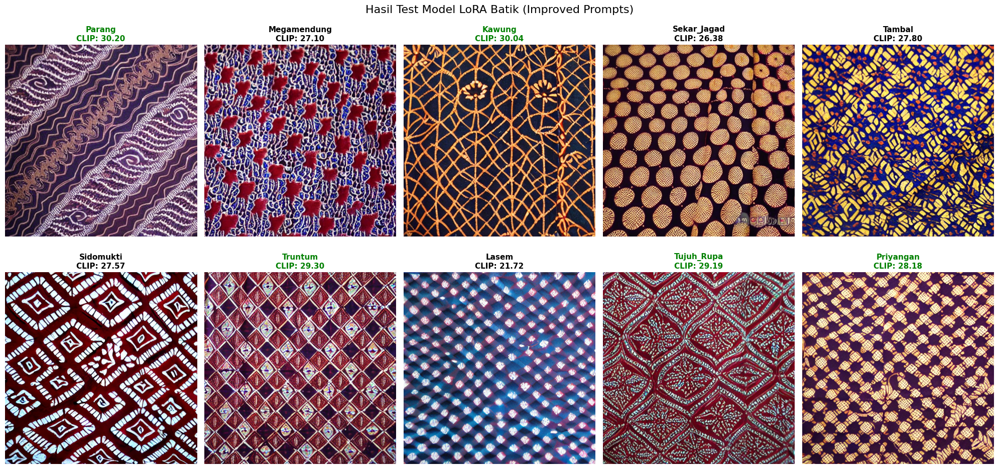

In [ ]:
# ... (kode setup_pipeline dan calculate_clip_score di atas TETAP SAMA) ...

def generate_and_evaluate_v2():
    pipe, clip_model, clip_processor = setup_pipeline()

    # --- SETTING PROMPT BARU ---
    # Tambahan detail agar gambar lebih bagus (Suffix)
    additional_prompt = ", close up photo of batik fabric, intricate pattern, high quality texture, 8k, sharp focus"

    # Negative prompt untuk membuang hasil jelek
    neg_prompt = "blurry, low quality, pixelated, ugly, watermark, text, distortion, messy"

    # Setup Plot
    fig, axes = plt.subplots(2, 5, figsize=(20, 10)) # Sedikit diperbesar
    fig.suptitle(f'Hasil Test Model LoRA Batik (Improved Prompts)', fontsize=16)
    axes = axes.flatten()

    print("\n🚀 Mulai Generate 10 Gambar dengan Prompt yang Lebih Bagus...")

    for i, trigger_word in enumerate(PROMPTS_LIST):
        if i >= 10: break

        # Gabungkan Trigger Word + Tambahan
        final_prompt = f"{trigger_word}{additional_prompt}"

        # Generate Image (Perhatikan penambahan negative_prompt)
        image = pipe(
            final_prompt,
            negative_prompt=neg_prompt,
            num_inference_steps=35,  # Naikkan dikit biar lebih matang
            guidance_scale=8.0,      # Naikkan dikit agar lebih patuh pada prompt
            width=512,
            height=512
        ).images[0]

        # Hitung Score (pakai trigger word asli saja untuk penilaian)
        score = calculate_clip_score(image, trigger_word, clip_model, clip_processor)

        # Tampilkan
        ax = axes[i]
        ax.imshow(image)
        ax.axis("off")

        short_name = trigger_word.replace("batik_style_", "").title()
        color = "green" if score > 28 else "black" # Batas aman score

        # Tampilkan Nama Batik & Score
        ax.set_title(f"{short_name}\nCLIP: {score:.2f}", color=color, fontsize=11, fontweight='bold')
        print(f"✅ [{i+1}/10] {short_name} - Score: {score:.2f}")

    plt.tight_layout()
    plt.show()

# Jalankan versi baru
generate_and_evaluate_v2()

⏳ Loading Stable Diffusion & LoRA...


Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .
No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/n

⏳ Loading CLIP Model (Juri Penilai)...

🚀 Mulai Generate Baju...


  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

✅ Selesai baris: Parang


  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

✅ Selesai baris: Megamendung


  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

✅ Selesai baris: Kawung


  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

✅ Selesai baris: Sekar_Jagad


  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

✅ Selesai baris: Tambal


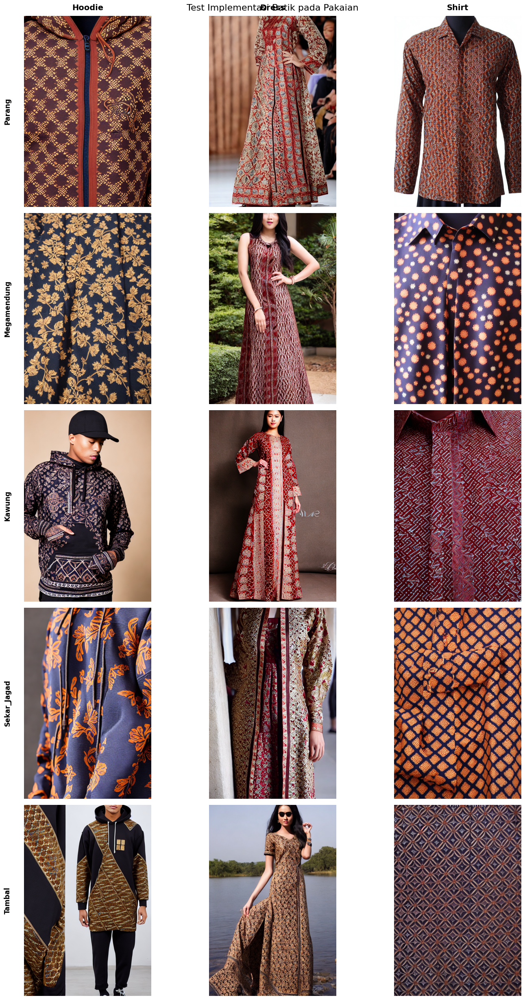

In [ ]:
def generate_clothing_test():
    pipe, clip_model, clip_processor = setup_pipeline()

    # Kita tes 5 motif teratas saja biar tidak terlalu lama
    selected_styles = PROMPTS_LIST[:5]

    # Definisi Prompt untuk tiap jenis baju
    clothing_types = {
        "Hoodie": "streetwear hoodie with {}, studio lighting, high quality, casual style, 8k, sharp focus",
        "Dress": "beautiful woman wearing elegant long dress with {} pattern, fashion photography, runway model, intricate details, masterpiece",
        "Shirt": "men's formal batik shirt with {} motif, close up, professional look, realistic fabric texture, 8k"
    }

    # Negative prompt standar
    neg_prompt = "bad anatomy, ugly, deformed, blurry, low quality, pixelated, watermark, text, messy, cartoon, illustration"

    # Setup Plot (Baris = Jumlah Motif, Kolom = Jenis Baju)
    fig, axes = plt.subplots(len(selected_styles), 3, figsize=(15, 25))
    fig.suptitle(f'Test Implementasi Batik pada Pakaian', fontsize=16)

    print("\n🚀 Mulai Generate Baju...")

    for i, trigger_word in enumerate(selected_styles):
        short_name = trigger_word.replace("batik_style_", "").title()

        # Loop untuk setiap jenis baju (Kolom)
        for j, (item_name, prompt_template) in enumerate(clothing_types.items()):

            # Masukkan trigger word ke dalam template prompt
            final_prompt = prompt_template.format(trigger_word)

            # Generate
            image = pipe(
                final_prompt,
                negative_prompt=neg_prompt,
                num_inference_steps=35,
                guidance_scale=8.0, # Agak tinggi biar polanya nempel
                width=512,
                height=768 # Format potrait lebih cocok untuk baju
            ).images[0]

            # Tampilkan
            if len(selected_styles) > 1:
                ax = axes[i, j]
            else:
                ax = axes[j]

            ax.imshow(image)
            ax.axis("off")

            if i == 0: # Judul kolom hanya di baris pertama
                ax.set_title(f"{item_name}", fontsize=14, fontweight='bold', pad=10)

            # Label di sebelah kiri untuk nama batik
            if j == 0:
                ax.text(-0.1, 0.5, short_name, transform=ax.transAxes,
                        va='center', ha='right', fontsize=12, fontweight='bold', rotation=90)

        print(f"✅ Selesai baris: {short_name}")

    plt.tight_layout()
    plt.show()

# Jalankan
generate_clothing_test()